In [2]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import sklearn
import pandas as pd
import os
import sys
import time
import tensorflow as tf

from tensorflow import keras

print(tf.__version__)
print(sys.version_info)
for module in mpl,np,pd,sklearn,tf,keras:
    print(module.__name__,module.__version__)

2.0.0-rc0
sys.version_info(major=3, minor=7, micro=3, releaselevel='final', serial=0)
matplotlib 3.0.3
numpy 1.16.2
pandas 0.24.2
sklearn 0.20.3
tensorflow 2.0.0-rc0
tensorflow.python.keras.api._v2.keras 2.2.4-tf


In [3]:
from sklearn.datasets import fetch_california_housing

housing = fetch_california_housing()
print(housing.DESCR)
print(housing.data.shape) # x
print(housing.target.shape) # y

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block
        - HouseAge      median house age in block
        - AveRooms      average number of rooms
        - AveBedrms     average number of bedrooms
        - Population    block population
        - AveOccup      average house occupancy
        - Latitude      house block latitude
        - Longitude     house block longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
http://lib.stat.cmu.edu/datasets/

The target variable is the median house value for California districts.

This dataset was derived from the 1990 U.S. census, using one row per census
block group. A block group is the smallest geographical unit for which the U.S.
Census Bur

In [4]:
# 划分样本
from sklearn.model_selection import train_test_split
x_train_all, x_test, y_train_all, y_test = train_test_split(
    housing.data, housing.target, random_state = 7 # 随机种子
)
x_train, x_valid, y_train, y_valid = train_test_split(
    x_train_all, y_train_all, random_state = 11
)
print(x_train.shape,y_train.shape)
print(x_valid.shape,y_valid.shape)
print(x_test.shape,y_test.shape)


(11610, 8) (11610,)
(3870, 8) (3870,)
(5160, 8) (5160,)


In [5]:
# 归一化
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_valid_scaled = scaler.transform(x_valid)
x_test_scaled = scaler.transform(x_test)

In [21]:
# RandomizedSearchCV
# 将keras模型转化为sklearn模型
# 定义参数几何
# 搜索参数 hidden_layers  layers_size  learning_rate


def build_model(hidden_layers = 1,layers_size = 30,learning_rate=3e-3):
    model = keras.models.Sequential()
    model.add(keras.layers.Dense(layers_size,activation="relu",
                                 input_shape=x_train.shape[1:]))
    
    for _ in range(hidden_layers - 1):
        model.add(keras.layers.Dense(layers_size,activation="relu"))
        
    model.add(keras.layers.Dense(1))
    optimizer = keras.optimizers.SGD(learning_rate)
    model.compile(loss="mse",optimizer=optimizer)
    
    return model

# keras.wrappers.scikit_learn.KerasRegressor  回归问题
# keras.wrappers.scikit_learn.KerasClassifier 分类问题
sklearn_model = keras.wrappers.scikit_learn.KerasRegressor(build_model)

history = sklearn_model.fit(x_train_scaled,y_train,epochs=20,
                            validation_data=(x_valid_scaled,y_valid))



Train on 11610 samples, validate on 3870 samples
Epoch 1/20
11610/11610 [==============================] - 1s 88us/sample - loss: 1.3819 - val_loss: 0.7576
Epoch 2/20
11610/11610 [==============================] - 1s 71us/sample - loss: 0.6368 - val_loss: 0.6382
Epoch 3/20
11610/11610 [==============================] - 1s 74us/sample - loss: 0.5556 - val_loss: 0.5863
Epoch 4/20
11610/11610 [==============================] - 1s 74us/sample - loss: 0.5239 - val_loss: 0.5557
Epoch 5/20
11610/11610 [==============================] - 1s 71us/sample - loss: 0.5042 - val_loss: 0.5369
Epoch 6/20
11610/11610 [==============================] - 1s 71us/sample - loss: 0.4817 - val_loss: 0.5094
Epoch 7/20
11610/11610 [==============================] - 1s 72us/sample - loss: 0.4701 - val_loss: 0.4985
Epoch 8/20
11610/11610 [==============================] - 1s 76us/sample - loss: 0.4662 - val_loss: 0.4897
Epoch 9/20
11610/11610 [==============================] - 1s 70us/sample - loss: 0.4495 - val_l

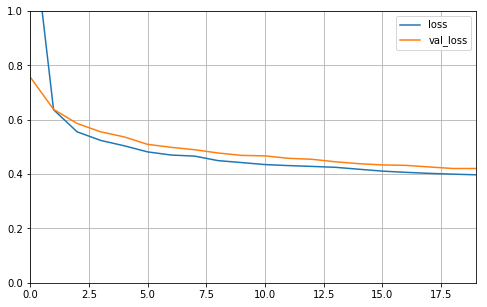

In [22]:
def plot_learning_curves(history):
    pd.DataFrame(history.history).plot(figsize=(8,5))
    plt.grid(True)
    plt.gca().set_ylim(0,1)
    plt.show()

plot_learning_curves(history)

In [23]:
from scipy.stats import reciprocal
# f(x) = 1/(x*log(b/a)) a<= x <= b


# 参数分布
param_distribution = {
    "hidden_layers":[1,2,3,4],
    "layers_size":np.arange(1,100),
    "learning_rate":reciprocal(1e-4,1e-2)
}

from sklearn.model_selection import RandomizedSearchCV

random_search_cv = RandomizedSearchCV(sklearn_model, param_distribution,
                                      n_iter = 10, # 产生多少个参数几何
                                      n_jobs = 1)  # 并行处理数
random_search_cv.fit(x_train_scaled,y_train,epochs=20,
                     validation_data=(x_valid_scaled,y_valid))

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 111us/sample - loss: 3.4932 - val_loss: 1.8755
Epoch 2/20
7740/7740 [==============================] - 1s 86us/sample - loss: 1.3531 - val_loss: 1.0124
Epoch 3/20
7740/7740 [==============================] - 1s 85us/sample - loss: 0.8699 - val_loss: 0.8224
Epoch 4/20
7740/7740 [==============================] - 1s 83us/sample - loss: 0.7576 - val_loss: 0.7675
Epoch 5/20
7740/7740 [==============================] - 1s 84us/sample - loss: 0.7155 - val_loss: 0.7392
Epoch 6/20
7740/7740 [==============================] - 1s 89us/sample - loss: 0.6925 - val_loss: 0.7206
Epoch 7/20
7740/7740 [==============================] - 1s 104us/sample - loss: 0.6754 - val_loss: 0.7064
Epoch 8/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.6617 - val_loss: 0.6929
Epoch 9/20
7740/7740 [==============================] - 1s 90us/sample - loss: 0.6496 - val_loss: 0.6808
Epoch

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 128us/sample - loss: 2.9624 - val_loss: 1.7111
Epoch 2/20
7740/7740 [==============================] - 1s 84us/sample - loss: 1.1711 - val_loss: 1.0527
Epoch 3/20
7740/7740 [==============================] - 1s 87us/sample - loss: 0.8412 - val_loss: 0.8564
Epoch 4/20
7740/7740 [==============================] - 1s 82us/sample - loss: 0.7208 - val_loss: 0.7719
Epoch 5/20
7740/7740 [==============================] - 1s 82us/sample - loss: 0.6712 - val_loss: 0.7308
Epoch 6/20
7740/7740 [==============================] - 1s 83us/sample - loss: 0.6459 - val_loss: 0.7065
Epoch 7/20
7740/7740 [==============================] - 1s 82us/sample - loss: 0.6296 - val_loss: 0.6876
Epoch 8/20
7740/7740 [==============================] - 1s 89us/sample - loss: 0.6163 - val_loss: 0.6722
Epoch 9/20
7740/7740 [==============================] - 1s 81us/sample - loss: 0.6047 - val_loss: 0.6591
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 105us/sample - loss: 2.8099 - val_loss: 1.7613
Epoch 2/20
7740/7740 [==============================] - 1s 86us/sample - loss: 1.1832 - val_loss: 1.0691
Epoch 3/20
7740/7740 [==============================] - 1s 82us/sample - loss: 0.8320 - val_loss: 0.8480
Epoch 4/20
7740/7740 [==============================] - 1s 83us/sample - loss: 0.7158 - val_loss: 0.7667
Epoch 5/20
7740/7740 [==============================] - 1s 83us/sample - loss: 0.6680 - val_loss: 0.7298
Epoch 6/20
7740/7740 [==============================] - 1s 83us/sample - loss: 0.6420 - val_loss: 0.7068
Epoch 7/20
7740/7740 [==============================] - 1s 77us/sample - loss: 0.6233 - val_loss: 0.6892
Epoch 8/20
7740/7740 [==============================] - 1s 81us/sample - loss: 0.6084 - val_loss: 0.6737
Epoch 9/20
7740/7740 [==============================] - 1s 82us/sample - loss: 0.5957 - val_loss: 0.6600
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 104us/sample - loss: 1.3177 - val_loss: 0.7277
Epoch 2/20
7740/7740 [==============================] - 1s 77us/sample - loss: 0.7308 - val_loss: 0.6536
Epoch 3/20
7740/7740 [==============================] - 1s 79us/sample - loss: 0.5957 - val_loss: 0.5469
Epoch 4/20
7740/7740 [==============================] - 1s 78us/sample - loss: 0.5106 - val_loss: 0.5148
Epoch 5/20
7740/7740 [==============================] - 1s 77us/sample - loss: 0.4822 - val_loss: 0.4945
Epoch 6/20
7740/7740 [==============================] - 1s 77us/sample - loss: 0.4706 - val_loss: 0.4840
Epoch 7/20
7740/7740 [==============================] - 1s 79us/sample - loss: 0.4561 - val_loss: 0.4627
Epoch 8/20
7740/7740 [==============================] - 1s 77us/sample - loss: 0.4446 - val_loss: 0.4552
Epoch 9/20
7740/7740 [==============================] - 1s 77us/sample - loss: 0.4363 - val_loss: 0.4442
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 114us/sample - loss: 1.0643 - val_loss: 0.6933
Epoch 2/20
7740/7740 [==============================] - 1s 80us/sample - loss: 0.6312 - val_loss: 0.8301
Epoch 3/20
7740/7740 [==============================] - 1s 79us/sample - loss: 1.0711 - val_loss: 0.5630
Epoch 4/20
7740/7740 [==============================] - 1s 78us/sample - loss: 0.5508 - val_loss: 0.4993
Epoch 5/20
7740/7740 [==============================] - 1s 78us/sample - loss: 0.4592 - val_loss: 0.4711
Epoch 6/20
7740/7740 [==============================] - 1s 76us/sample - loss: 0.4475 - val_loss: 0.4557
Epoch 7/20
7740/7740 [==============================] - 1s 77us/sample - loss: 0.4278 - val_loss: 0.4451
Epoch 8/20
7740/7740 [==============================] - 1s 83us/sample - loss: 0.4171 - val_loss: 0.4319
Epoch 9/20
7740/7740 [==============================] - 1s 77us/sample - loss: 0.4096 - val_loss: 0.5054
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 110us/sample - loss: 0.9318 - val_loss: 0.6895
Epoch 2/20
7740/7740 [==============================] - 1s 78us/sample - loss: 0.7813 - val_loss: 0.6191
Epoch 3/20
7740/7740 [==============================] - 1s 77us/sample - loss: 0.6294 - val_loss: 0.5295
Epoch 4/20
7740/7740 [==============================] - 1s 85us/sample - loss: 0.4722 - val_loss: 0.5044
Epoch 5/20
7740/7740 [==============================] - 1s 79us/sample - loss: 0.4487 - val_loss: 0.4792
Epoch 6/20
7740/7740 [==============================] - 1s 79us/sample - loss: 0.4325 - val_loss: 0.4619
Epoch 7/20
7740/7740 [==============================] - 1s 78us/sample - loss: 0.4202 - val_loss: 0.4493
Epoch 8/20
7740/7740 [==============================] - 1s 78us/sample - loss: 0.4108 - val_loss: 0.4393
Epoch 9/20
7740/7740 [==============================] - 1s 78us/sample - loss: 0.4035 - val_loss: 0.4374
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 128us/sample - loss: 1.1287 - val_loss: 0.6500
Epoch 2/20
7740/7740 [==============================] - ETA: 0s - loss: 0.567 - 1s 93us/sample - loss: 0.5685 - val_loss: 0.5467
Epoch 3/20
7740/7740 [==============================] - 1s 95us/sample - loss: 0.4985 - val_loss: 0.4960
Epoch 4/20
7740/7740 [==============================] - 1s 94us/sample - loss: 0.4645 - val_loss: 0.4654
Epoch 5/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.4379 - val_loss: 0.4436
Epoch 6/20
7740/7740 [==============================] - 1s 93us/sample - loss: 0.4195 - val_loss: 0.4212
Epoch 7/20
7740/7740 [==============================] - 1s 94us/sample - loss: 0.4073 - val_loss: 0.4114
Epoch 8/20
7740/7740 [==============================] - 1s 94us/sample - loss: 0.3985 - val_loss: 0.4115
Epoch 9/20
7740/7740 [==============================] - 1s 93us/sample - loss: 0.3900 -

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 145us/sample - loss: 1.1932 - val_loss: 0.7240
Epoch 2/20
7740/7740 [==============================] - 1s 96us/sample - loss: 0.6233 - val_loss: 0.5970
Epoch 3/20
7740/7740 [==============================] - 1s 94us/sample - loss: 0.5185 - val_loss: 0.5124
Epoch 4/20
7740/7740 [==============================] - 1s 96us/sample - loss: 0.4581 - val_loss: 0.4609
Epoch 5/20
7740/7740 [==============================] - 1s 97us/sample - loss: 0.4192 - val_loss: 0.4222
Epoch 6/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.3945 - val_loss: 0.4277
Epoch 7/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.3799 - val_loss: 0.3856
Epoch 8/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.3685 - val_loss: 0.3768
Epoch 9/20
7740/7740 [==============================] - 1s 94us/sample - loss: 0.3614 - val_loss: 0.3723
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 128us/sample - loss: 1.4739 - val_loss: 0.7325
Epoch 2/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.5960 - val_loss: 0.6019
Epoch 3/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.5115 - val_loss: 0.5434
Epoch 4/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.4706 - val_loss: 0.5028
Epoch 5/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.4409 - val_loss: 0.4760
Epoch 6/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.4222 - val_loss: 0.4515
Epoch 7/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.4076 - val_loss: 0.4374
Epoch 8/20
7740/7740 [==============================] - 1s 91us/sample - loss: 0.3935 - val_loss: 0.4292
Epoch 9/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.3844 - val_loss: 0.4107
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 129us/sample - loss: 0.8795 - val_loss: 0.5826
Epoch 2/20
7740/7740 [==============================] - 1s 100us/sample - loss: 0.5049 - val_loss: 0.4824
Epoch 3/20
7740/7740 [==============================] - 1s 101us/sample - loss: 0.4397 - val_loss: 0.4385
Epoch 4/20
7740/7740 [==============================] - 1s 109us/sample - loss: 0.4070 - val_loss: 0.4102
Epoch 5/20
7740/7740 [==============================] - 1s 95us/sample - loss: 0.3907 - val_loss: 0.3898
Epoch 6/20
7740/7740 [==============================] - 1s 96us/sample - loss: 0.3780 - val_loss: 0.3902
Epoch 7/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.3718 - val_loss: 0.3887
Epoch 8/20
7740/7740 [==============================] - 1s 95us/sample - loss: 0.3637 - val_loss: 0.3708
Epoch 9/20
7740/7740 [==============================] - 1s 98us/sample - loss: 0.3567 - val_loss: 0.3716
Epo

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 127us/sample - loss: 1.6171 - val_loss: 0.6348
Epoch 2/20
7740/7740 [==============================] - 1s 95us/sample - loss: 0.5571 - val_loss: 0.5517
Epoch 3/20
7740/7740 [==============================] - 1s 94us/sample - loss: 0.4950 - val_loss: 0.4992
Epoch 4/20
7740/7740 [==============================] - 1s 94us/sample - loss: 0.4560 - val_loss: 0.4683
Epoch 5/20
7740/7740 [==============================] - 1s 95us/sample - loss: 0.4238 - val_loss: 0.4342
Epoch 6/20
7740/7740 [==============================] - 1s 93us/sample - loss: 0.4003 - val_loss: 0.4240
Epoch 7/20
7740/7740 [==============================] - 1s 93us/sample - loss: 0.3840 - val_loss: 0.3962
Epoch 8/20
7740/7740 [==============================] - 1s 94us/sample - loss: 0.3730 - val_loss: 0.3895
Epoch 9/20
7740/7740 [==============================] - 1s 93us/sample - loss: 0.3623 - val_loss: 0.3804
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 127us/sample - loss: 1.0822 - val_loss: 0.6354
Epoch 2/20
7740/7740 [==============================] - 1s 93us/sample - loss: 0.5317 - val_loss: 0.5477
Epoch 3/20
7740/7740 [==============================] - 1s 104us/sample - loss: 0.4695 - val_loss: 0.4929
Epoch 4/20
7740/7740 [==============================] - 1s 95us/sample - loss: 0.4303 - val_loss: 0.4484
Epoch 5/20
7740/7740 [==============================] - 1s 94us/sample - loss: 0.4055 - val_loss: 0.4324
Epoch 6/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.3860 - val_loss: 0.4110
Epoch 7/20
7740/7740 [==============================] - 1s 95us/sample - loss: 0.3698 - val_loss: 0.3954
Epoch 8/20
7740/7740 [==============================] - 1s 94us/sample - loss: 0.3584 - val_loss: 0.3906
Epoch 9/20
7740/7740 [==============================] - 1s 93us/sample - loss: 0.3504 - val_loss: 0.3762
Epoch

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 107us/sample - loss: 4.2663 - val_loss: 3.6257
Epoch 2/20
7740/7740 [==============================] - 1s 84us/sample - loss: 2.9414 - val_loss: 2.5322
Epoch 3/20
7740/7740 [==============================] - 1s 84us/sample - loss: 2.1140 - val_loss: 1.8653
Epoch 4/20
7740/7740 [==============================] - 1s 83us/sample - loss: 1.6111 - val_loss: 1.4640
Epoch 5/20
7740/7740 [==============================] - 1s 83us/sample - loss: 1.3090 - val_loss: 1.2301
Epoch 6/20
7740/7740 [==============================] - 1s 82us/sample - loss: 1.1272 - val_loss: 1.0881
Epoch 7/20
7740/7740 [==============================] - 1s 83us/sample - loss: 1.0149 - val_loss: 1.0006
Epoch 8/20
7740/7740 [==============================] - 1s 79us/sample - loss: 0.9413 - val_loss: 0.9421
Epoch 9/20
7740/7740 [==============================] - 1s 84us/sample - loss: 0.8900 - val_loss: 0.9012
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 107us/sample - loss: 4.6115 - val_loss: 3.8125
Epoch 2/20
7740/7740 [==============================] - 1s 85us/sample - loss: 2.9813 - val_loss: 2.5745
Epoch 3/20
7740/7740 [==============================] - 1s 85us/sample - loss: 2.0771 - val_loss: 1.8897
Epoch 4/20
7740/7740 [==============================] - 1s 85us/sample - loss: 1.5778 - val_loss: 1.5068
Epoch 5/20
7740/7740 [==============================] - 1s 90us/sample - loss: 1.2983 - val_loss: 1.2868
Epoch 6/20
7740/7740 [==============================] - 1s 85us/sample - loss: 1.1301 - val_loss: 1.1472
Epoch 7/20
7740/7740 [==============================] - 1s 85us/sample - loss: 1.0211 - val_loss: 1.0527
Epoch 8/20
7740/7740 [==============================] - 1s 83us/sample - loss: 0.9446 - val_loss: 0.9839
Epoch 9/20
7740/7740 [==============================] - 1s 81us/sample - loss: 0.8882 - val_loss: 0.9323
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 106us/sample - loss: 5.0282 - val_loss: 4.3475
Epoch 2/20
7740/7740 [==============================] - 1s 86us/sample - loss: 3.4448 - val_loss: 3.0322
Epoch 3/20
7740/7740 [==============================] - 1s 89us/sample - loss: 2.4977 - val_loss: 2.2361
Epoch 4/20
7740/7740 [==============================] - 1s 85us/sample - loss: 1.9075 - val_loss: 1.7527
Epoch 5/20
7740/7740 [==============================] - 1s 84us/sample - loss: 1.5301 - val_loss: 1.4424
Epoch 6/20
7740/7740 [==============================] - 1s 85us/sample - loss: 1.2875 - val_loss: 1.2499
Epoch 7/20
7740/7740 [==============================] - 1s 85us/sample - loss: 1.1265 - val_loss: 1.1227
Epoch 8/20
7740/7740 [==============================] - 1s 86us/sample - loss: 1.0153 - val_loss: 1.0341
Epoch 9/20
7740/7740 [==============================] - 1s 83us/sample - loss: 0.9349 - val_loss: 0.9686
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 105us/sample - loss: 3.5362 - val_loss: 3.0396
Epoch 2/20
7740/7740 [==============================] - 1s 80us/sample - loss: 2.3637 - val_loss: 2.1750
Epoch 3/20
7740/7740 [==============================] - 1s 79us/sample - loss: 1.7209 - val_loss: 1.6627
Epoch 4/20
7740/7740 [==============================] - 1s 78us/sample - loss: 1.3452 - val_loss: 1.3435
Epoch 5/20
7740/7740 [==============================] - 1s 78us/sample - loss: 1.1155 - val_loss: 1.1396
Epoch 6/20
7740/7740 [==============================] - 1s 80us/sample - loss: 0.9733 - val_loss: 1.0079
Epoch 7/20
7740/7740 [==============================] - 1s 78us/sample - loss: 0.8816 - val_loss: 0.9193
Epoch 8/20
7740/7740 [==============================] - 1s 78us/sample - loss: 0.8204 - val_loss: 0.8610
Epoch 9/20
7740/7740 [==============================] - 1s 85us/sample - loss: 0.7778 - val_loss: 0.8195
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 106us/sample - loss: 4.1684 - val_loss: 3.1291
Epoch 2/20
7740/7740 [==============================] - 1s 79us/sample - loss: 2.4270 - val_loss: 2.0249
Epoch 3/20
7740/7740 [==============================] - 1s 80us/sample - loss: 1.6827 - val_loss: 1.5096
Epoch 4/20
7740/7740 [==============================] - 1s 86us/sample - loss: 1.3121 - val_loss: 1.2375
Epoch 5/20
7740/7740 [==============================] - 1s 82us/sample - loss: 1.1086 - val_loss: 1.0844
Epoch 6/20
7740/7740 [==============================] - 1s 79us/sample - loss: 0.9868 - val_loss: 0.9885
Epoch 7/20
7740/7740 [==============================] - 1s 81us/sample - loss: 0.9079 - val_loss: 0.9242
Epoch 8/20
7740/7740 [==============================] - 1s 79us/sample - loss: 0.8519 - val_loss: 0.8770
Epoch 9/20
7740/7740 [==============================] - 1s 80us/sample - loss: 0.8102 - val_loss: 0.8399
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 107us/sample - loss: 8.6835 - val_loss: 6.2216
Epoch 2/20
7740/7740 [==============================] - 1s 81us/sample - loss: 4.5756 - val_loss: 3.9155
Epoch 3/20
7740/7740 [==============================] - 1s 78us/sample - loss: 3.0971 - val_loss: 2.8841
Epoch 4/20
7740/7740 [==============================] - 1s 79us/sample - loss: 2.3905 - val_loss: 2.3461
Epoch 5/20
7740/7740 [==============================] - 1s 79us/sample - loss: 2.0115 - val_loss: 2.0393
Epoch 6/20
7740/7740 [==============================] - 1s 76us/sample - loss: 1.7910 - val_loss: 1.8507
Epoch 7/20
7740/7740 [==============================] - 1s 80us/sample - loss: 1.6522 - val_loss: 1.7267
Epoch 8/20
7740/7740 [==============================] - 1s 79us/sample - loss: 1.5592 - val_loss: 1.6403
Epoch 9/20
7740/7740 [==============================] - 1s 79us/sample - loss: 1.4931 - val_loss: 1.5766
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 103us/sample - loss: 3.0699 - val_loss: 1.9062
Epoch 2/20
7740/7740 [==============================] - 1s 81us/sample - loss: 1.4087 - val_loss: 1.1821
Epoch 3/20
7740/7740 [==============================] - 1s 91us/sample - loss: 1.0063 - val_loss: 0.9455
Epoch 4/20
7740/7740 [==============================] - 1s 90us/sample - loss: 0.8508 - val_loss: 0.8467
Epoch 5/20
7740/7740 [==============================] - 1s 80us/sample - loss: 0.7813 - val_loss: 0.7987
Epoch 6/20
7740/7740 [==============================] - 1s 79us/sample - loss: 0.7444 - val_loss: 0.7707
Epoch 7/20
7740/7740 [==============================] - 1s 79us/sample - loss: 0.7201 - val_loss: 0.7493
Epoch 8/20
7740/7740 [==============================] - 1s 79us/sample - loss: 0.7008 - val_loss: 0.7310
Epoch 9/20
7740/7740 [==============================] - 1s 78us/sample - loss: 0.6838 - val_loss: 0.7142
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 104us/sample - loss: 3.2309 - val_loss: 1.8893
Epoch 2/20
7740/7740 [==============================] - 1s 80us/sample - loss: 1.3480 - val_loss: 1.1476
Epoch 3/20
7740/7740 [==============================] - 1s 80us/sample - loss: 0.9643 - val_loss: 0.9368
Epoch 4/20
7740/7740 [==============================] - 1s 78us/sample - loss: 0.8296 - val_loss: 0.8474
Epoch 5/20
7740/7740 [==============================] - 1s 79us/sample - loss: 0.7651 - val_loss: 0.7961
Epoch 6/20
7740/7740 [==============================] - 1s 82us/sample - loss: 0.7246 - val_loss: 0.7597
Epoch 7/20
7740/7740 [==============================] - 1s 78us/sample - loss: 0.6947 - val_loss: 0.7327
Epoch 8/20
7740/7740 [==============================] - 1s 79us/sample - loss: 0.6711 - val_loss: 0.7098
Epoch 9/20
7740/7740 [==============================] - 1s 90us/sample - loss: 0.6514 - val_loss: 0.6911
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 110us/sample - loss: 2.7497 - val_loss: 1.5061
Epoch 2/20
7740/7740 [==============================] - 1s 80us/sample - loss: 1.0482 - val_loss: 0.9483
Epoch 3/20
7740/7740 [==============================] - 1s 80us/sample - loss: 0.7748 - val_loss: 0.8185
Epoch 4/20
7740/7740 [==============================] - 1s 81us/sample - loss: 0.7053 - val_loss: 0.7727
Epoch 5/20
7740/7740 [==============================] - 1s 84us/sample - loss: 0.6769 - val_loss: 0.7485
Epoch 6/20
7740/7740 [==============================] - 1s 80us/sample - loss: 0.6586 - val_loss: 0.7304
Epoch 7/20
7740/7740 [==============================] - 1s 80us/sample - loss: 0.6441 - val_loss: 0.7160
Epoch 8/20
7740/7740 [==============================] - 1s 80us/sample - loss: 0.6312 - val_loss: 0.7031
Epoch 9/20
7740/7740 [==============================] - 1s 78us/sample - loss: 0.6194 - val_loss: 0.6912
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 135us/sample - loss: 2.0406 - val_loss: 0.6713
Epoch 2/20
7740/7740 [==============================] - 1s 86us/sample - loss: 0.6169 - val_loss: 0.5822
Epoch 3/20
7740/7740 [==============================] - 1s 83us/sample - loss: 0.5511 - val_loss: 0.5426
Epoch 4/20
7740/7740 [==============================] - 1s 85us/sample - loss: 0.5185 - val_loss: 0.5161
Epoch 5/20
7740/7740 [==============================] - 1s 86us/sample - loss: 0.4983 - val_loss: 0.4984
Epoch 6/20
7740/7740 [==============================] - 1s 85us/sample - loss: 0.4852 - val_loss: 0.4860
Epoch 7/20
7740/7740 [==============================] - 1s 86us/sample - loss: 0.4761 - val_loss: 0.4800
Epoch 8/20
7740/7740 [==============================] - 1s 86us/sample - loss: 0.4676 - val_loss: 0.4718
Epoch 9/20
7740/7740 [==============================] - 1s 86us/sample - loss: 0.4600 - val_loss: 0.4615
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 109us/sample - loss: 2.3952 - val_loss: 1.2985
Epoch 2/20
7740/7740 [==============================] - 1s 85us/sample - loss: 1.1304 - val_loss: 0.9394
Epoch 3/20
7740/7740 [==============================] - 1s 86us/sample - loss: 0.8090 - val_loss: 0.7640
Epoch 4/20
7740/7740 [==============================] - 1s 84us/sample - loss: 0.6843 - val_loss: 0.6799
Epoch 5/20
7740/7740 [==============================] - 1s 93us/sample - loss: 0.6217 - val_loss: 0.6399
Epoch 6/20
7740/7740 [==============================] - 1s 84us/sample - loss: 0.5864 - val_loss: 0.6092
Epoch 7/20
7740/7740 [==============================] - 1s 85us/sample - loss: 0.5600 - val_loss: 0.5810
Epoch 8/20
7740/7740 [==============================] - 1s 85us/sample - loss: 0.5362 - val_loss: 0.5566
Epoch 9/20
7740/7740 [==============================] - 1s 95us/sample - loss: 0.5148 - val_loss: 0.5313
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 122us/sample - loss: 2.2821 - val_loss: 0.9719
Epoch 2/20
7740/7740 [==============================] - 1s 96us/sample - loss: 0.7116 - val_loss: 0.7049
Epoch 3/20
7740/7740 [==============================] - 1s 93us/sample - loss: 0.6171 - val_loss: 0.6484
Epoch 4/20
7740/7740 [==============================] - 1s 94us/sample - loss: 0.5705 - val_loss: 0.6032
Epoch 5/20
7740/7740 [==============================] - 1s 99us/sample - loss: 0.5358 - val_loss: 0.5716
Epoch 6/20
7740/7740 [==============================] - 1s 93us/sample - loss: 0.5110 - val_loss: 0.5453
Epoch 7/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.4914 - val_loss: 0.5261
Epoch 8/20
7740/7740 [==============================] - 1s 92us/sample - loss: 0.4774 - val_loss: 0.5116
Epoch 9/20
7740/7740 [==============================] - 1s 90us/sample - loss: 0.4647 - val_loss: 0.4963
Epoch 

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 119us/sample - loss: 1.5374 - val_loss: 0.8620
Epoch 2/20
7740/7740 [==============================] - 1s 90us/sample - loss: 0.8282 - val_loss: 0.7090
Epoch 3/20
7740/7740 [==============================] - 1s 97us/sample - loss: 0.6341 - val_loss: 0.6341
Epoch 4/20
7740/7740 [==============================] - 1s 103us/sample - loss: 0.5732 - val_loss: 0.5709
Epoch 5/20
7740/7740 [==============================] - 1s 97us/sample - loss: 0.5254 - val_loss: 0.5240
Epoch 6/20
7740/7740 [==============================] - 1s 98us/sample - loss: 0.4907 - val_loss: 0.4932
Epoch 7/20
7740/7740 [==============================] - 1s 98us/sample - loss: 0.4664 - val_loss: 0.4689
Epoch 8/20
7740/7740 [==============================] - 1s 96us/sample - loss: 0.4495 - val_loss: 0.4533
Epoch 9/20
7740/7740 [==============================] - 1s 107us/sample - loss: 0.4366 - val_loss: 0.4420
Epoc

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 133us/sample - loss: 1.2820 - val_loss: 0.7343
Epoch 2/20
7740/7740 [==============================] - 1s 96us/sample - loss: 0.6442 - val_loss: 0.6372
Epoch 3/20
7740/7740 [==============================] - 1s 93us/sample - loss: 0.5916 - val_loss: 0.5861
Epoch 4/20
7740/7740 [==============================] - 1s 85us/sample - loss: 0.5292 - val_loss: 0.5264
Epoch 5/20
7740/7740 [==============================] - 1s 91us/sample - loss: 0.4952 - val_loss: 0.4982
Epoch 6/20
7740/7740 [==============================] - 1s 88us/sample - loss: 0.4649 - val_loss: 0.4816
Epoch 7/20
7740/7740 [==============================] - 1s 100us/sample - loss: 0.4536 - val_loss: 0.4713
Epoch 8/20
7740/7740 [==============================] - 1s 103us/sample - loss: 0.4446 - val_loss: 0.4638
Epoch 9/20
7740/7740 [==============================] - 1s 104us/sample - loss: 0.4363 - val_loss: 0.4593
Epo

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 131us/sample - loss: 1.3594 - val_loss: 0.7195
Epoch 2/20
7740/7740 [==============================] - 1s 101us/sample - loss: 0.6147 - val_loss: 0.6558
Epoch 3/20
7740/7740 [==============================] - 1s 103us/sample - loss: 0.5706 - val_loss: 0.6137
Epoch 4/20
7740/7740 [==============================] - 1s 89us/sample - loss: 0.5387 - val_loss: 0.5822
Epoch 5/20
7740/7740 [==============================] - 1s 96us/sample - loss: 0.5131 - val_loss: 0.5564
Epoch 6/20
7740/7740 [==============================] - 1s 95us/sample - loss: 0.4908 - val_loss: 0.5326
Epoch 7/20
7740/7740 [==============================] - 1s 104us/sample - loss: 0.4736 - val_loss: 0.5160
Epoch 8/20
7740/7740 [==============================] - 1s 100us/sample - loss: 0.4584 - val_loss: 0.4960
Epoch 9/20
7740/7740 [==============================] - 1s 101us/sample - loss: 0.4457 - val_loss: 0.4915
E

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 143us/sample - loss: 4.6562 - val_loss: 4.2449
Epoch 2/20
7740/7740 [==============================] - 1s 111us/sample - loss: 3.5343 - val_loss: 3.2193
Epoch 3/20
7740/7740 [==============================] - 1s 110us/sample - loss: 2.6416 - val_loss: 2.4141
Epoch 4/20
7740/7740 [==============================] - 1s 102us/sample - loss: 1.9812 - val_loss: 1.8577
Epoch 5/20
7740/7740 [==============================] - 1s 111us/sample - loss: 1.5517 - val_loss: 1.5106
Epoch 6/20
7740/7740 [==============================] - 1s 117us/sample - loss: 1.2994 - val_loss: 1.3044
Epoch 7/20
7740/7740 [==============================] - 1s 114us/sample - loss: 1.1470 - val_loss: 1.1690
Epoch 8/20
7740/7740 [==============================] - 1s 116us/sample - loss: 1.0434 - val_loss: 1.0705
Epoch 9/20
7740/7740 [==============================] - 1s 109us/sample - loss: 0.9652 - val_loss: 0.992

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 145us/sample - loss: 3.8622 - val_loss: 3.3142
Epoch 2/20
7740/7740 [==============================] - 1s 110us/sample - loss: 2.5982 - val_loss: 2.2503
Epoch 3/20
7740/7740 [==============================] - 1s 122us/sample - loss: 1.8237 - val_loss: 1.6891
Epoch 4/20
7740/7740 [==============================] - 1s 101us/sample - loss: 1.4386 - val_loss: 1.3989
Epoch 5/20
7740/7740 [==============================] - 1s 108us/sample - loss: 1.2207 - val_loss: 1.2188
Epoch 6/20
7740/7740 [==============================] - 1s 104us/sample - loss: 1.0820 - val_loss: 1.0920
Epoch 7/20
7740/7740 [==============================] - 1s 94us/sample - loss: 0.9802 - val_loss: 1.0015
Epoch 8/20
7740/7740 [==============================] - 1s 102us/sample - loss: 0.9073 - val_loss: 0.9335
Epoch 9/20
7740/7740 [==============================] - 1s 101us/sample - loss: 0.8525 - val_loss: 0.8831

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 7740 samples, validate on 3870 samples
Epoch 1/20
7740/7740 [==============================] - 1s 154us/sample - loss: 4.7540 - val_loss: 4.1398
Epoch 2/20
7740/7740 [==============================] - 1s 103us/sample - loss: 3.2605 - val_loss: 2.9042
Epoch 3/20
7740/7740 [==============================] - 1s 103us/sample - loss: 2.2742 - val_loss: 2.1358
Epoch 4/20
7740/7740 [==============================] - 1s 103us/sample - loss: 1.7212 - val_loss: 1.7578
Epoch 5/20
7740/7740 [==============================] - 1s 96us/sample - loss: 1.4515 - val_loss: 1.5576
Epoch 6/20
7740/7740 [==============================] - 1s 95us/sample - loss: 1.3026 - val_loss: 1.4262
Epoch 7/20
7740/7740 [==============================] - 1s 95us/sample - loss: 1.2007 - val_loss: 1.3242
Epoch 8/20
7740/7740 [==============================] - 1s 94us/sample - loss: 1.1219 - val_loss: 1.2378
Epoch 9/20
7740/7740 [==============================] - 1s 95us/sample - loss: 1.0555 - val_loss: 1.1649
Epo

7740/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

Train on 11610 samples, validate on 3870 samples
Epoch 1/20
11610/11610 [==============================] - 1s 114us/sample - loss: 0.7541 - val_loss: 0.5330
Epoch 2/20
11610/11610 [==============================] - 1s 89us/sample - loss: 0.4544 - val_loss: 0.4598
Epoch 3/20
11610/11610 [==============================] - 1s 88us/sample - loss: 0.4071 - val_loss: 0.4113
Epoch 4/20
11610/11610 [==============================] - 1s 89us/sample - loss: 0.3857 - val_loss: 0.3907
Epoch 5/20
11610/11610 [==============================] - 1s 86us/sample - loss: 0.3716 - val_loss: 0.3895
Epoch 6/20
11610/11610 [==============================] - 1s 87us/sample - loss: 0.3612 - val_loss: 0.3749
Epoch 7/20
11610/11610 [==============================] - 1s 87us/sample - loss: 0.3539 - val_loss: 0.3642
Epoch 8/20
11610/11610 [==============================] - 1s 91us/sample - loss: 0.3477 - val_loss: 0.4058
Epoch 9/20
11610/11610 [==============================] - 1s 86us/sample - loss: 0.3433 - val_

RandomizedSearchCV(cv='warn', error_score='raise-deprecating',
          estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasRegressor object at 0x000001E607C256A0>,
          fit_params=None, iid='warn', n_iter=10, n_jobs=1,
          param_distributions={'hidden_layers': [1, 2, 3, 4], 'layers_size': array([ 1,  2, ..., 98, 99]), 'learning_rate': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001E60788EA90>},
          pre_dispatch='2*n_jobs', random_state=None, refit=True,
          return_train_score='warn', scoring=None, verbose=0)

In [11]:
from scipy.stats import reciprocal
reciprocal.rvs(1e-4,1e-2,size=10)

array([0.00156416, 0.00020425, 0.00059234, 0.00018282, 0.000885  ,
       0.00211083, 0.00050216, 0.00062626, 0.00093715, 0.00026897])

In [19]:
np.arange(1,100)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
       86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])

In [24]:
print(random_search_cv.best_params_)
print(random_search_cv.best_score_)
print(random_search_cv.best_estimator_)

{'hidden_layers': 4, 'layers_size': 52, 'learning_rate': 0.005875776102238213}
-0.3445272483233231


In [27]:
model = random_search_cv.best_estimator_.model
model.evaluate(x_test_scaled,y_test)

5160/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

0.32297722678775936